In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import chi2_contingency

C:\Users\LabSystem\AppData\Local\Temp\ipykernel_9464\2966691409.py:6: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  GH1 = pd.read_csv(file1, encoding='latin1')


                        label  GH_count  GH_percentage  HF_count  \
0              add dependency      3432       2.274188       236   
1      external documentation     31626      20.956723      6651   
2                  input data      3906       2.588281        88   
3      internal documentation      7717       5.113610       120   
4             model structure     44812      29.694323      2462   
5                 output data       466       0.308791       601   
6            parameter tuning      4525       2.998456      1562   
7        pipeline performance      4800       3.180683        30   
8               preprocessing      8533       5.654326      2843   
9            project metadata      5541       3.671701      1409   
10          remove dependency       906       0.600354       104   
11                    sharing      6978       4.623917       721   
12    training infrastructure     13606       9.015910       132   
13          update dependency      3495       2.

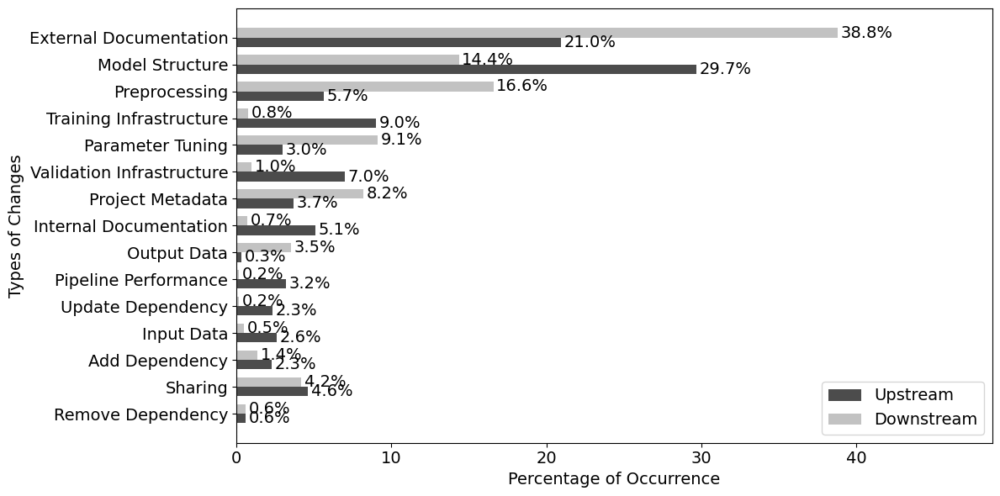

                        label  GH_count  GH_percentage
0              add dependency      3432       2.274188
1      external documentation     31626      20.956723
2                  input data      3906       2.588281
3      internal documentation      7717       5.113610
4             model structure     44812      29.694323
5                 output data       466       0.308791
6            parameter tuning      4525       2.998456
7        pipeline performance      4800       3.180683
8               preprocessing      8533       5.654326
9            project metadata      5541       3.671701
10          remove dependency       906       0.600354
11                    sharing      6978       4.623917
12    training infrastructure     13606       9.015910
13          update dependency      3495       2.315935
14  validation infrastructure     10568       7.002803
                        label  HF_count  HF_percentage
0              add dependency       236       1.375612
1      ext

In [9]:
# Load the CSV files
file1 = "GH_labelled_combined_csv_file.csv"
file2 = "HF_all_labels_from_gemini.csv"
f2 = "must_exclude_from_all_analysis.csv"

GH1 = pd.read_csv(file1, encoding='latin1')
HF1 = pd.read_csv(file2, encoding='latin1')
dfs2 = pd.read_csv(f2, encoding='latin1')

exclusion = list(dfs2['family'].unique())
excluded_labels = ['bug fix', 'unclear', 'uncategorized', 'add model']

GH2 = GH1[~GH1['label'].isin(exclusion)]
HF2 = HF1[~HF1['label'].isin(exclusion)]

GH = GH2[~GH2['label'].isin(excluded_labels)]
HF = HF2[~HF2['label'].isin(excluded_labels)]

GH_group = GH.groupby('label').size().reset_index(name='GH_count')
HF_group = HF.groupby('label').size().reset_index(name='HF_count')

# Calculate total counts for each platform
GH_total = GH_group['GH_count'].sum()
HF_total = HF_group['HF_count'].sum()

# Calculate percentages
GH_group['GH_percentage'] = GH_group['GH_count'] / GH_total * 100
HF_group['HF_percentage'] = HF_group['HF_count'] / HF_total * 100

# Merge the two dataframes
merged_df = pd.merge(GH_group, HF_group, on='label', how='outer').fillna(0)
print(merged_df)
# Calculate the difference in percentages
merged_df['percentage_difference'] = merged_df['GH_percentage'] - merged_df['HF_percentage']

# Sort by the absolute difference in percentages
merged_df = merged_df.sort_values(by='percentage_difference', key=abs, ascending=True)

# Capitalize each word in the 'label' column
merged_df['label'] = merged_df['label'].str.title()

# Visualize the results
plt.figure(figsize=(12, 6))
y = np.arange(len(merged_df['label']))
height = 0.35

# Create horizontal bars with gray colors
bars1 = plt.barh(y - height/2, merged_df['GH_percentage'], height, label='Upstream', color='black', alpha=0.7)
bars2 = plt.barh(y + height/2, merged_df['HF_percentage'], height, label='Downstream', color='darkgrey', alpha=0.7)

# Add percentage labels outside the bars with slight adjustments to avoid overlap
for i, v in enumerate(merged_df['GH_percentage']):
    plt.text(v + 0.2, i - height/2, f'{v:.1f}%', va='center', color='black', fontsize=14)

for i, v in enumerate(merged_df['HF_percentage']):
    # Adjust x position of text label to ensure it stays inside the plot area
    plt.text(v + 0.2, i + height/2, f'{v:.1f}%', va='center', color='black', fontsize=14)

# Adjust the x-axis limits to make room for the labels
plt.xlim(0, max(merged_df['GH_percentage'].max(), merged_df['HF_percentage'].max()) + 10)

# Set labels and ticks
plt.ylabel('Types of Changes', fontsize=14)
plt.xlabel('Percentage of Occurrence', fontsize=14)
plt.yticks(y, merged_df['label'], fontsize=14)
plt.xticks(fontsize=14)
plt.legend(fontsize=14)

# Add a vertical line at x=0 for better readability
plt.axvline(x=0, color='gray', linestyle='--', linewidth=0.8)

plt.tight_layout()
plt.savefig("RQ01.pdf", bbox_inches='tight')
plt.show()

# Display the updated DataFrames
print(GH_group)
print(HF_group)

C:\Users\LabSystem\AppData\Local\Temp\ipykernel_9464\2241403979.py:11: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  GH1 = pd.read_csv(file1, encoding='latin1')
C:\Users\LabSystem\AppData\Local\Temp\ipykernel_9464\2241403979.py:56: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(tick / total * 100)}%" for tick in ax.get_yticks()], fontsize=14, color='black')


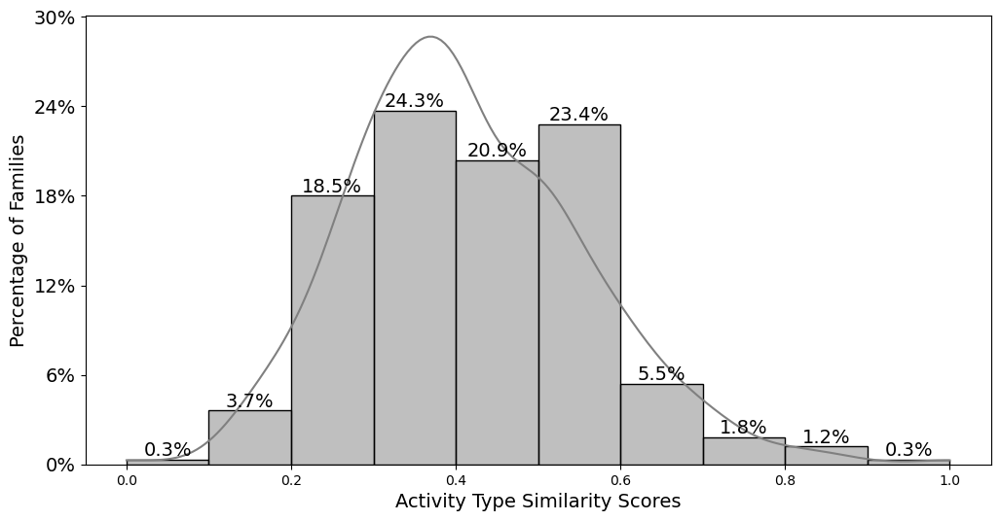

                        Family  Similarity Score
0          google_multilingual          0.357143
1            HooshvareLab_bert          0.428571
2          protectai_llm-guard          0.266667
3                wxjiao_alpaca          0.428571
4                  jinaai_jina          0.600000
..                         ...               ...
320          bigcode_starcoder          0.500000
321        microsoft_llmlingua          0.375000
322  NousResearch_Yarn-Mistral          0.500000
323     l3cube-pune_marathiNLP          0.500000
324          DeepPavlov_rubert          0.400000

[325 rows x 2 columns]

Top 5 Most Similar Families:
facebook_dragon             1.000000
bigscience_workshop         0.866667
stabilityai_StableBeluga    0.833333
distilbert_distilbert       0.800000
MoritzLaurer_DeBERTa        0.800000
dtype: float64

Bottom 5 Least Similar Families:
Nexusflow_NexusRaven     0.000000
microsoft_infoxlm        0.133333
apple_OpenELM            0.142857
cais_HarmBench        

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the CSV files
file1 = "GH_labelled_combined_csv_file.csv"
file2 = "HF_all_labels_from_gemini.csv"
f2 = "must_exclude_from_all_analysis.csv"

GH1 = pd.read_csv(file1, encoding='latin1')
HF1 = pd.read_csv(file2, encoding='latin1')
dfs2 = pd.read_csv(f2, encoding='latin1')

exclusion = list(dfs2['family'].unique())
excluded_labels = ['bug fix', 'unclear', 'uncategorized', 'add model']

GH2 = GH1[~GH1['family'].isin(exclusion)]
HF2 = HF1[~HF1['family'].isin(exclusion)]

GH = GH2[~GH2['label'].isin(excluded_labels)]
HF = HF2[~HF2['label'].isin(excluded_labels)]

HF_grouped = HF.groupby('family')['label'].value_counts(normalize=True).unstack(fill_value=0)
GH_grouped = GH.groupby('family')['label'].value_counts(normalize=True).unstack(fill_value=0)

# Calculate Jaccard similarity
def jaccard_similarity(set1, set2):
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union != 0 else 0

similarity_scores = {}
for family in set(HF_grouped.index).intersection(set(GH_grouped.index)):
    hf_activities = set(HF_grouped.loc[family].index[HF_grouped.loc[family] > 0])
    gh_activities = set(GH_grouped.loc[family].index[GH_grouped.loc[family] > 0])
    similarity_scores[family] = jaccard_similarity(hf_activities, gh_activities)

# Convert similarity scores to a Pandas Series
similarity_series = pd.Series(similarity_scores)

# Plot histogram with percentages
plt.figure(figsize=(12, 6))
ax = sns.histplot(similarity_series, kde=True, bins=10, color='gray')  # Set bars to gray

# Convert y-axis counts to percentage
total = len(similarity_series)
for p in ax.patches:
    height = p.get_height()
    if height > 0:  # Avoid annotating empty bins
        percentage = f"{(height / total) * 100:.1f}%"
        ax.text(p.get_x() + p.get_width() / 2, height, percentage,
                ha='center', va='bottom', fontsize=14, color='black')  # Text color set to black

# Adjust y-axis labels to percentages
ax.set_yticklabels([f"{int(tick / total * 100)}%" for tick in ax.get_yticks()], fontsize=14, color='black')

# Titles and labels with black text color
plt.xlabel('Activity Type Similarity Scores', fontsize=14, color='black')
plt.ylabel('Percentage of Families', fontsize=14, color='black')

# Keep the background white (default)
plt.gcf().set_facecolor('white')
ax.set_facecolor('white')

# Optionally, add a light gray grid for better visibility
#ax.grid(True, linestyle='--', linewidth=0.5, color='gray')

# Save the plot
plt.savefig('similarity_distribution.pdf', dpi=300, bbox_inches='tight')
plt.savefig("RQ02.pdf", bbox_inches='tight')
plt.show()
#plt.show()

# Summary statistics
summary_stats = similarity_series.describe()
#print("Summary Statistics of Similarity Scores:")
#print(similarity_series)
similarity_df = similarity_series.to_frame(name='Similarity Score')

# Reset the index to make 'Family' a column
similarity_df = similarity_df.reset_index()

# Rename the 'index' column to 'Family'
similarity_df = similarity_df.rename(columns={'index': 'Family'})
print(similarity_df)

# Save results to CSV
#similarity_df.to_csv('I:/Paper2/PAPER2_experiment_steps/NLP/Experiment_for_top_models/RQ0_result/family_similarity_scores.csv', index=False)

# Find families with highest and lowest similarity
top_5_similar = similarity_series.nlargest(5)
bottom_5_similar = similarity_series.nsmallest(5)

print("\nTop 5 Most Similar Families:")
print(top_5_similar)

print("\nBottom 5 Least Similar Families:")
print(bottom_5_similar)

# Save results to CSV
results_df = pd.DataFrame.from_dict(similarity_scores, orient='index', columns=['Similarity Score'])
similarity_df.to_csv('family_similarity_scores.csv', index=False)

print("\nResults saved to 'family_similarity_scores.csv'")


In [4]:
file1 = "GH_data_devil.csv"
file2 = "HF_data_devil.csv"

df1 = pd.read_csv(file1, encoding='latin1')
df2 = pd.read_csv(file2, encoding='latin1')

C:\Users\LabSystem\AppData\Local\Temp\ipykernel_9464\3264817966.py:4: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(file1, encoding='latin1')


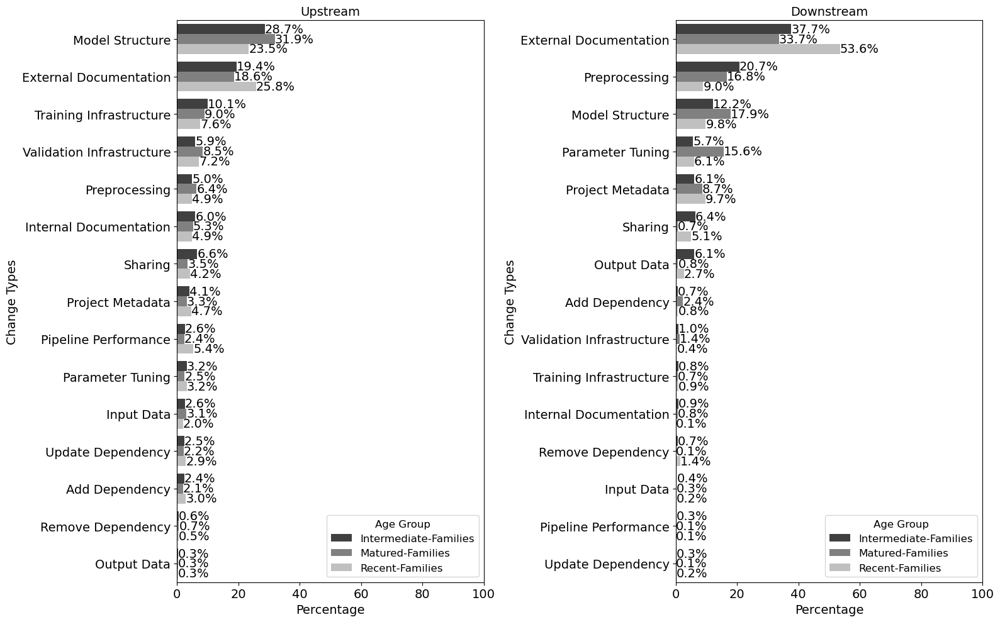

In [8]:
file1 = "GH_data_devil.csv"
file2 = "HF_data_devil.csv"

df1 = pd.read_csv(file1, encoding='latin1')
df2 = pd.read_csv(file2, encoding='latin1')

def capitalize_words(text):
    return ' '.join(word.capitalize() for word in text.split())

def plot_activity_distribution(df, title, ax):
    df['label'] = df['label'].apply(capitalize_words)

    # Group by 'age_group' and 'label' to get the count of each activity in each age group
    activity_counts = df.groupby(['age_group', 'label']).size().reset_index(name='count')

    # Calculate percentages within each age_group
    activity_counts['percentage'] = activity_counts.groupby('age_group')['count'].transform(lambda x: x / x.sum() * 100)

    # Sort labels by total count
    label_order = activity_counts.groupby('label')['count'].sum().sort_values(ascending=False).index

    # Create a horizontal grouped bar plot
    sns.barplot(
        data=activity_counts,
        y='label',
        x='percentage',
        hue='age_group',
        palette='gray',  # Use muted colors for a subtle appearance
        ax=ax,
        orient='h',
        order=label_order
    )

    ax.set_title(title, fontsize=14)
    ax.set_ylabel('Change Types', fontsize=14)
    ax.set_xlabel('Percentage', fontsize=14)
    ax.tick_params(axis='y', rotation=0, labelsize=14)
    ax.tick_params(axis='x', labelsize=14)

    # Add percentage labels to the end of each bar with font size 14
    for container in ax.containers:
        ax.bar_label(container, fmt='%.1f%%', label_type='edge', fontsize=14)

    ax.set_xlim(0, 100)

    # Set legend position to middle right inside the figure
    ax.legend(title='Age Group', fontsize=12, title_fontsize=12, loc='lower right')

# Create subplots with more space between them
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 10))  # Increase figure size

# Plot for GitHub data
plot_activity_distribution(df1, 'Upstream', axes[0])

# Plot for Hugging Face data
plot_activity_distribution(df2, 'Downstream', axes[1])

# Adjust layout for better spacing
plt.tight_layout()

# Save the plot
plt.savefig("argument_1.pdf", bbox_inches='tight')
plt.show()


In [6]:
df_gh = df1
df_hf = df2

# Function to create a contingency table for a specific age group
def create_age_specific_contingency(df_gh, df_hf, age_group):
    gh_subset = df_gh[df_gh['age_group'] == age_group]
    hf_subset = df_hf[df_hf['age_group'] == age_group]

    # Create count tables
    gh_counts = gh_subset['label'].value_counts().rename("GitHub").to_frame()
    hf_counts = hf_subset['label'].value_counts().rename("Hugging Face").to_frame()

    # Combine GitHub and Hugging Face counts
    combined = gh_counts.join(hf_counts, how='outer').fillna(0)  # Fill missing labels with 0

    return combined

# List of age groups
age_groups = ['Recent-Families', 'Intermediate-Families', 'Matured-Families']

# Calculate Bonferroni-corrected significance level
alpha = 0.05
num_tests = len(age_groups)
bonferroni_alpha = alpha / num_tests

# Perform chi-square tests for each age group
for age in age_groups:
    print(f"\nChi-square test for {age} models:\n")

    contingency_table = create_age_specific_contingency(df_gh, df_hf, age)

    # Perform the test
    chi2, p, dof, expected = chi2_contingency(contingency_table)

    # Compute sample size (total observations)
    n = contingency_table.to_numpy().sum()

    # Compute Cramér’s V
    #v = cramers_v(chi2, n, dof)

    # Print results
    print(contingency_table)
    print(f"Chi-square value: {chi2:.4f}")
    print(f"P-value: {p:.4f}")
    print(f"Degrees of freedom: {dof}")
    #print(f"Cramér's V (effect size): {v:.4f}")
    print("Expected frequencies under null hypothesis:")
    print(pd.DataFrame(expected, index=contingency_table.index, columns=contingency_table.columns))

    # Interpretation with Bonferroni correction
    if p < bonferroni_alpha:
        print(f"\n➡ Statistically significant difference found between GitHub and Hugging Face for {age} models (Bonferroni-corrected p < {bonferroni_alpha:.4f}).\n")
    else:
        print(f"\n➡ No statistically significant difference found for {age} models (Bonferroni-corrected p ≥ {bonferroni_alpha:.4f}).\n")

print(f"Note: Bonferroni-corrected significance level: {bonferroni_alpha:.4f}")



Chi-square test for Recent-Families models:

                           GitHub  Hugging Face
label                                          
Add Dependency                933            26
External Documentation       8120          1786
Input Data                    622             6
Internal Documentation       1540             4
Model Structure              7382           326
Output Data                    96            90
Parameter Tuning             1012           202
Pipeline Performance         1690             4
Preprocessing                1539           300
Project Metadata             1472           323
Remove Dependency             168            48
Sharing                      1337           169
Training Infrastructure      2386            31
Update Dependency             914             5
Validation Infrastructure    2258            13
Chi-square value: 2675.8645
P-value: 0.0000
Degrees of freedom: 14
Expected frequencies under null hypothesis:
                           

In [7]:
from scipy.stats import shapiro, levene, chi2_contingency
import pandas as pd

df_gh = df1
df_hf = df2

# Function to create contingency table (same as before)
def create_age_specific_contingency(df_gh, df_hf, age_group):
    gh_subset = df_gh[df_gh['age_group'] == age_group]
    hf_subset = df_hf[df_hf['age_group'] == age_group]

    # Create count tables
    gh_counts = gh_subset['label'].value_counts().rename("GitHub").to_frame()
    hf_counts = hf_subset['label'].value_counts().rename("Hugging Face").to_frame()

    # Combine GitHub and Hugging Face counts
    combined = gh_counts.join(hf_counts, how='outer').fillna(0)  # Fill missing labels with 0

    return combined

# List of age groups
age_groups = ['Recent-Families', 'Intermediate-Families', 'Matured-Families']

# Normality and Homogeneity of Variance Tests
for age in age_groups:
    print(f"\nTesting normality for {age} models:\n")

    # Get contingency table
    contingency_table = create_age_specific_contingency(df_gh, df_hf, age)

    # Flatten counts for normality and variance tests
    gh_values = contingency_table["GitHub"].values
    hf_values = contingency_table["Hugging Face"].values

    # Shapiro-Wilk test for normality
    stat_gh, p_gh = shapiro(gh_values)
    stat_hf, p_hf = shapiro(hf_values)
    
    print(f"Shapiro-Wilk test (GitHub): p-value = {p_gh:.4f}")
    print(f"Shapiro-Wilk test (Hugging Face): p-value = {p_hf:.4f}")

    # Levene’s test for homogeneity of variance
    stat_var, p_var = levene(gh_values, hf_values)
    print(f"Levene’s test p-value: {p_var:.4f}")

    # Interpretation
    if p_gh < 0.05 or p_hf < 0.05:
        print("➡ Data is NOT normally distributed. Chi-square may not be appropriate.\n")
    else:
        print("✅ Data is normally distributed. Proceeding with Chi-square test.\n")

    if p_var < 0.05:
        print("➡ Variances are NOT equal. Consider using a non-parametric alternative.\n")
    else:
        print("✅ Variances are equal. Proceeding with Chi-square test.\n")

# Bonferroni correction
alpha = 0.05
bonferroni_alpha = alpha / len(age_groups)
print(f"Note: Bonferroni-corrected significance level: {bonferroni_alpha:.4f}")



Testing normality for Recent-Families models:

Shapiro-Wilk test (GitHub): p-value = 0.0002
Shapiro-Wilk test (Hugging Face): p-value = 0.0000
Levene’s test p-value: 0.0500
➡ Data is NOT normally distributed. Chi-square may not be appropriate.

➡ Variances are NOT equal. Consider using a non-parametric alternative.


Testing normality for Intermediate-Families models:

Shapiro-Wilk test (GitHub): p-value = 0.0004
Shapiro-Wilk test (Hugging Face): p-value = 0.0001
Levene’s test p-value: 0.0599
➡ Data is NOT normally distributed. Chi-square may not be appropriate.

✅ Variances are equal. Proceeding with Chi-square test.


Testing normality for Matured-Families models:

Shapiro-Wilk test (GitHub): p-value = 0.0002
Shapiro-Wilk test (Hugging Face): p-value = 0.0003
Levene’s test p-value: 0.0514
➡ Data is NOT normally distributed. Chi-square may not be appropriate.

✅ Variances are equal. Proceeding with Chi-square test.

Note: Bonferroni-corrected significance level: 0.0167


In [7]:
def cramers_v(chi2, n, dof):
    return np.sqrt(chi2 / (n * min(dof, len(age_groups) - 1)))

for age in age_groups:
    contingency_table = create_age_specific_contingency(df_gh, df_hf, age)
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    print((n * min(dof, len(age_groups) - 1)))
    print(min(dof, len(age_groups)-1))

    # Compute Cramér’s V
    n = contingency_table.values.sum()
    print(n)
    print(dof)
    effect_size = cramers_v(chi2, n, dof)

    print(f"\nEffect Size (Cramér’s V) for {age}: {effect_size:.4f}")

127748
2
34802
14

Effect Size (Cramér’s V) for Recent-Families: 0.1961
69604
2
50786
14

Effect Size (Cramér’s V) for Intermediate-Families: 0.2698
101572
2
63874
14

Effect Size (Cramér’s V) for Matured-Families: 0.2164


In [8]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
import re

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Load the CSV files
file1 = "GH_labelled_combined_csv_file.csv"
file2 = "HF_all_labels_from_gemini.csv"
f2 = "must_exclude_from_all_analysis.csv"
f3 = "families_per_bin_used.csv"

GH1 = pd.read_csv(file1, encoding='latin1')
HF1 = pd.read_csv(file2, encoding='latin1')
dfs2 = pd.read_csv(f2, encoding='latin1')
family_bin = pd.read_csv(f3, encoding='latin1')

exclusion = list(dfs2['family'].unique())
excluded_labels = ['bug fix', 'unclear', 'uncategorized', 'add model']

GH2 = GH1[~GH1['family'].isin(exclusion)]
HF2 = HF1[~HF1['family'].isin(exclusion)]

GH = GH2[~GH2['label'].isin(excluded_labels)]
HF = HF2[~HF2['label'].isin(excluded_labels)]

df_zero = family_bin[family_bin['bin'] == "0.0 to 0.1"]
zero_list = list(df_zero['families'])

df_one = family_bin[family_bin['bin'] == "0.1 to 0.2"]
one_list = list(df_one['families'])

df_two = family_bin[family_bin['bin'] == "0.2 to 0.3"]
two_list = list(df_two['families'])

df_three = family_bin[family_bin['bin'] == "0.3 to 0.4"]
three_list = list(df_three['families'])

df_four = family_bin[family_bin['bin'] == "0.4 to 0.5"]
four_list = list(df_four['families'])

df_five = family_bin[family_bin['bin'] == "0.5 to 0.6"]
five_list = list(df_five['families'])

df_six = family_bin[family_bin['bin'] == "0.6 to 0.7"]
six_list = list(df_six['families'])

df_seven = family_bin[family_bin['bin'] == "0.7 to 0.8"]
seven_list = list(df_seven['families'])

df_eight = family_bin[family_bin['bin'] == "0.8 to 0.9"]
eight_list = list(df_eight['families'])

df_nine = family_bin[family_bin['bin'] == "0.9 to 1.0"]
nine_list = list(df_nine['families'])


GH_zero = GH[GH['family'].isin(zero_list)]
HF_zero = HF[HF['family'].isin(zero_list)]

GH_one = GH[GH['family'].isin(one_list)]
HF_one = HF[HF['family'].isin(one_list)]

GH_two = GH[GH['family'].isin(two_list)]
HF_two = HF[HF['family'].isin(two_list)]

GH_three = GH[GH['family'].isin(three_list)]
HF_three = HF[HF['family'].isin(three_list)]

GH_four = GH[GH['family'].isin(four_list)]
HF_four = HF[HF['family'].isin(four_list)]

GH_five = GH[GH['family'].isin(five_list)]
HF_five = HF[HF['family'].isin(five_list)]

GH_six = GH[GH['family'].isin(six_list)]
HF_six = HF[HF['family'].isin(six_list)]

GH_seven = GH[GH['family'].isin(seven_list)]
HF_seven = HF[HF['family'].isin(seven_list)]

GH_eight = GH[GH['family'].isin(eight_list)]
HF_eight = HF[HF['family'].isin(eight_list)]

GH_nine = GH[GH['family'].isin(nine_list)]
HF_nine = HF[HF['family'].isin(nine_list)]


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\LabSystem\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\LabSystem\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\LabSystem\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
C:\Users\LabSystem\AppData\Local\Temp\ipykernel_21036\1731781263.py:19: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  GH1 = pd.read_csv(file1, encoding='latin1')


In [39]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
import re
#from RQ03 import *

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')



def analyze_commits(df, platform, pipeline_name, custom_stopwords):
    """Analyzes commit messages, removes stopwords, and filters short words."""

    if platform == "HF":
        message_column = 'combined'
    elif platform == "GH":
        message_column = 'commit_message'
    else:
        raise ValueError("Invalid platform. Must be 'HF' or 'GH'.")

    if message_column not in df.columns:
        print(f"Error: Column '{message_column}' not found in {platform} DataFrame.")
        return []

    commit_messages = df[message_column].dropna().tolist()  # Drop NaNs before processing
    cleaned_messages = []

    # Combine stopwords (all lowercase)
    stop_words = set(word.lower() for word in stopwords.words('english')).union(custom_stopwords)

    print("\n[DEBUG] Custom Stopwords (First 10):", list(stop_words)[:10])  # Debug Stopwords

    lemmatizer = WordNetLemmatizer()

    for message in commit_messages:
        message = message.lower()

        # Remove specific words ('by', 'co') and numbers
        message = re.sub(r'\b(by|co|of|authored|.md|\d+)\b', '', message, flags=re.IGNORECASE)
        message = re.sub(r'[^\w\s-]', '', message)

        # Remove extra spaces caused by replacements
        message = re.sub(r'\s+', ' ', message).strip()
        tokens = word_tokenize(message)

        # Remove stopwords and short words (<=2 characters)
        filtered_tokens = [w for w in tokens if w.lower() not in stop_words and len(w) > 2]

        lemmatized_tokens = [lemmatizer.lemmatize(w) for w in filtered_tokens]
        cleaned_message = " ".join(lemmatized_tokens)
        cleaned_messages.append(cleaned_message)

    # **Final Check Before TF-IDF**
    cleaned_messages = [
        " ".join([word for word in msg.split() if word.lower() not in stop_words])
        for msg in cleaned_messages
    ]

    if not cleaned_messages:
        print("Warning: All commit messages were removed after cleaning.")
        return []

    vectorizer = TfidfVectorizer()
    try:
        tfidf_matrix = vectorizer.fit_transform(cleaned_messages)
        feature_names = vectorizer.get_feature_names_out()
        tfidf_scores = tfidf_matrix.toarray().sum(axis=0)
        word_scores = dict(zip(feature_names, tfidf_scores))
        sorted_word_scores = sorted(word_scores.items(), key=lambda item: item[1], reverse=True)
        return sorted_word_scores
    except ValueError as e:
        print(f"TF-IDF Error: {e}")
        return []

custom_stopwords = set(word.lower() for word in [
    "of", "by", "using", "upload", "update", "add", "delete", "adding",
    "co", "authored", "author", "create", "name", "added", "remove"
])

results = {}

# Define the new dataframes and their corresponding labels
dataframes = [
    (HF_zero, "HF", "Bin 0.0 - 0.1"),
    (GH_zero, "GH", "Bin 0.0 - 0.1"),
    (HF_one, "HF", "Bin 0.1 - 0.2"),
    (GH_one, "GH", "Bin 0.1 - 0.2"),
    (HF_two, "HF", "Bin 0.2 - 0.3"),
    (GH_two, "GH", "Bin 0.2 - 0.3"),
    (HF_three, "HF", "Bin 0.3 - 0.4"),
    (GH_three, "GH", "Bin 0.3 - 0.4"),
    (HF_four, "HF", "Bin 0.4 - 0.5"),
    (GH_four, "GH", "Bin 0.4 - 0.5"),
    (HF_five, "HF", "Bin 0.5 - 0.6"),
    (GH_five, "GH", "Bin 0.5 - 0.6"),
    (HF_six, "HF", "Bin 0.6 - 0.7"),
    (GH_six, "GH", "Bin 0.6 - 0.7"),
    (HF_seven, "HF", "Bin 0.7 - 0.8"),
    (GH_seven, "GH", "Bin 0.7 - 0.8"),
    (HF_eight, "HF", "Bin 0.8 - 0.9"),
    (GH_eight, "GH", "Bin 0.8 - 0.9"),
    (HF_nine, "HF", "Bin 0.9 - 1.0"),
    (GH_nine, "GH", "Bin 0.9 - 1.0")
]

# Iterate through each dataframe, analyze commits, and store results
"""for df, platform, bin_label in dataframes:
    if not df.empty:
        print(f"\nAnalyzing {platform} - {bin_label}...")
        word_scores = analyze_commits(df, platform, bin_label, custom_stopwords)
        results[f"{platform}_{bin_label}"] = word_scores

# Print the results
for key, value in results.items():
    print(f"\n--- {key} ---")
    if value:
        for word, score in value[:10]:  # Display top 10 keywords
            print(f"{word}: {score}")
    else:
        print("No keywords found.")"""


def get_keyword_count(bin_label):
    if bin_label in ['0.0-0.1', '0.9-1.0']:
        return 2
    elif bin_label in ['0.1-0.2', '0.7-0.8', '0.8-0.9']:
        return 5
    elif bin_label in ['0.2-0.3', '0.6-0.7']:
        return 7
    else:  # for '0.3-0.4', '0.4-0.5', '0.5-0.6'
        return 10


# Analyze commits and store results
for df, platform, bin_label in dataframes:
    if not df.empty:
        print(f"\nAnalyzing {platform} - {bin_label}...")
        word_scores = analyze_commits(df, platform, bin_label, custom_stopwords)
        results[f"{platform}_{bin_label}"] = word_scores

# Print results
for key, value in results.items():
    platform, bin_label = key.split('_', 1)

    # **Fix the bin label format** to match `get_keyword_count()`
    formatted_bin_label = bin_label.replace("Bin ", "").replace(" - ", "-")

    keyword_count = get_keyword_count(formatted_bin_label)

    print(f"\n--- {key} ---")
    if value:
        for word, score in value[:keyword_count]:  # Display top N keywords based on bin
            print(f"{word}: {score}")
    else:
        print("No keywords found.")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\LabSystem\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\LabSystem\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\LabSystem\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!



Analyzing HF - Bin 0.0 - 0.1...

[DEBUG] Custom Stopwords (First 10): ['so', "i'll", 'these', "shouldn't", 'myself', 'm', "she's", 'using', 'by', 'here']

Analyzing GH - Bin 0.0 - 0.1...

[DEBUG] Custom Stopwords (First 10): ['so', "i'll", 'these', "shouldn't", 'myself', 'm', "she's", 'using', 'by', 'here']

Analyzing HF - Bin 0.1 - 0.2...

[DEBUG] Custom Stopwords (First 10): ['so', "i'll", 'these', "shouldn't", 'myself', 'm', "she's", 'using', 'by', 'here']

Analyzing GH - Bin 0.1 - 0.2...

[DEBUG] Custom Stopwords (First 10): ['so', "i'll", 'these', "shouldn't", 'myself', 'm', "she's", 'using', 'by', 'here']

Analyzing HF - Bin 0.2 - 0.3...

[DEBUG] Custom Stopwords (First 10): ['so', "i'll", 'these', "shouldn't", 'myself', 'm', "she's", 'using', 'by', 'here']

Analyzing GH - Bin 0.2 - 0.3...

[DEBUG] Custom Stopwords (First 10): ['so', "i'll", 'these', "shouldn't", 'myself', 'm', "she's", 'using', 'by', 'here']

Analyzing HF - Bin 0.3 - 0.4...

[DEBUG] Custom Stopwords (First 10):

C:\Users\LabSystem\AppData\Local\Temp\ipykernel_9464\3883306279.py:8: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  df_gh = pd.read_csv(file1, encoding='latin1')
C:\Users\LabSystem\AppData\Local\Temp\ipykernel_9464\3883306279.py:49: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_grouped = comb_data.groupby(["age_group", "similarity_score_group"])["family"].count().reset_index()


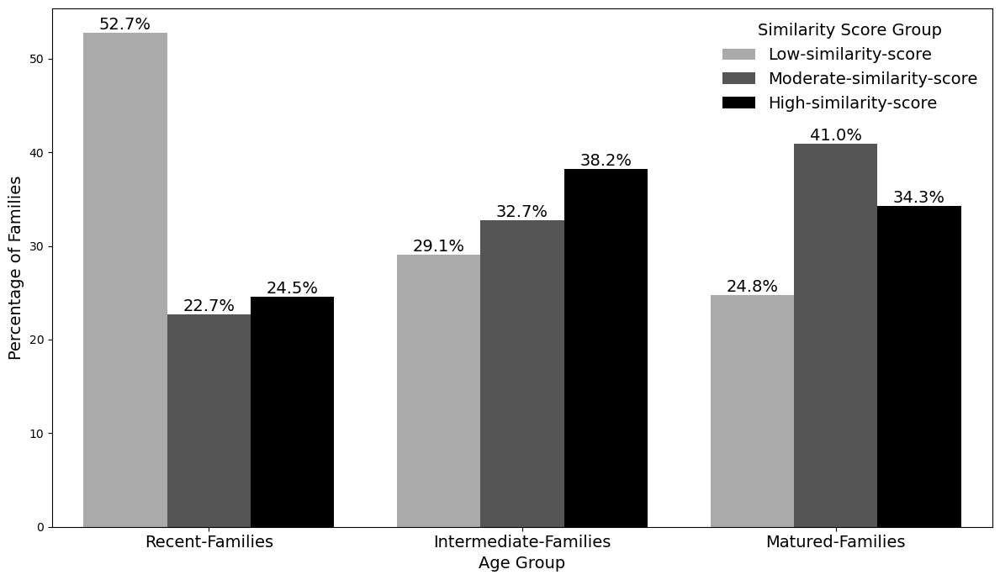

In [11]:
# Load the datasets
file1 = "GH_data_devil.csv"
file2 = "HF_data_devil.csv"
f1 = "families_per_bin_used.csv"
f2 = "family_similarity_scores.csv"
f3 = "family_author_comparison.json"

df_gh = pd.read_csv(file1, encoding='latin1')
df_hf = pd.read_csv(file2, encoding='latin1')
family_bin = pd.read_csv(f1, encoding='latin1')
sim_score = pd.read_csv(f2, encoding='latin1')
common_author = pd.read_json(f3, encoding='latin1')

sim_score = sim_score.rename(columns={'Family': 'family'})

sim_score['similarity_score_group'] = pd.qcut(sim_score['Similarity Score'], q=3, labels=["Low-similarity-score", "Moderate-similarity-score", "High-similarity-score"])

recent = sim_score[sim_score['similarity_score_group'] == "Recent-Families"]
intermediate = sim_score[sim_score['similarity_score_group'] == "Intermediate-Families"]
matured = sim_score[sim_score['similarity_score_group'] == "Matured-Families"]

recent_ages = f"the minimum is {recent['Similarity Score'].min()} and the maximum is {recent['Similarity Score'].max()}"
inter_ages = f"the minimum is {intermediate['Similarity Score'].min()} and the maximum is {intermediate['Similarity Score'].max()}"
matured_ages = f"the minimum is {matured['Similarity Score'].min()} and the maximum is {matured['Similarity Score'].max()}"

group_family = df_hf.groupby(["family", "age_group"]).agg({
    'author': 'nunique'
}).reset_index()

gh = df_gh.groupby(["family", "age_group"]).agg({
    'author_username': 'unique'
}).reset_index()

hf = df_hf.groupby(["family", "age_group"]).agg({
    'author': 'unique'
}).reset_index()


HF = pd.merge(df_hf, sim_score, on='family', how='inner')
GH = pd.merge(df_gh, sim_score, on='family', how='inner')

families = group_family[["family", "age_group"]]

comb_data = pd.merge(sim_score, families, on='family', how='inner')

age_order = ["Recent-Families", "Intermediate-Families", "Matured-Families"]

# Count families in each category
df_grouped = comb_data.groupby(["age_group", "similarity_score_group"])["family"].count().reset_index()

# Calculate percentages within each age group
df_grouped["percentage"] = df_grouped.groupby("age_group")["family"].transform(lambda x: (x / x.sum()) * 100)

# Sort the x-axis correctly
df_grouped["age_group"] = pd.Categorical(df_grouped["age_group"], categories=age_order, ordered=True)

# Plot
"""plt.figure(figsize=(12, 7))
ax = sns.barplot(data=df_grouped, x="age_group", y="percentage", hue="similarity_score_group", color='gray')

# Add percentage labels on top of bars
for container in ax.containers:
    ax.bar_label(container, fmt="%.1f%%", label_type="edge", fontsize=14)

# Set labels and title with font size 14
plt.xlabel("Age Group", fontsize=14)
plt.ylabel("Percentage of Families", fontsize=14)
#plt.title("Distribution of Families Across Similarity Score Groups and Age Groups", fontsize=14)

# Set legend title and labels with font size 14
plt.legend(title="Similarity Score Group", title_fontsize=14, fontsize=14, frameon=False)

# Set x-axis tick labels with font size 14
plt.xticks(rotation=0, fontsize=14)

# Adjust layout for better spacing
plt.tight_layout()

# Save the plot
plt.savefig("argument2_1.pdf", bbox_inches='tight')
plt.show()"""

plt.figure(figsize=(12, 7))
palette = {
    "High-similarity-score": "black",
    "Moderate-similarity-score": "#555555",  # deep gray
    "Low-similarity-score": "#aaaaaa"       # light gray
}

ax = sns.barplot(
    data=df_grouped, 
    x="age_group", 
    y="percentage", 
    hue="similarity_score_group", 
    palette=palette
)

# Add percentage labels on top of bars
for container in ax.containers:
    ax.bar_label(container, fmt="%.1f%%", label_type="edge", fontsize=14)

# Set labels and title with font size 14
plt.xlabel("Age Group", fontsize=14)
plt.ylabel("Percentage of Families", fontsize=14)

# Set legend title and labels with font size 14
plt.legend(title="Similarity Score Group", title_fontsize=14, fontsize=14, frameon=False)

# Set x-axis tick labels with font size 14
plt.xticks(rotation=0, fontsize=14)

# Adjust layout for better spacing
plt.tight_layout()

# Save the plot
plt.savefig("argument2_1.pdf", bbox_inches='tight')
plt.show()

In [12]:
sim_score['similarity_score_group']

low = sim_score[sim_score["similarity_score_group"] == "Low-similarity-score"]
mod = sim_score[sim_score["similarity_score_group"] == "Moderate-similarity-score"]
hig = sim_score[sim_score["similarity_score_group"] == "High-similarity-score"]

low_ = f"The minimum is {low['Similarity Score'].min()} and the maximum is {low['Similarity Score'].max()}"
mod_ = f"The minimum is {mod['Similarity Score'].min()} and the maximum is {mod['Similarity Score'].max()}"
hig_ = f"The minimum is {hig['Similarity Score'].min()} and the maximum is {hig['Similarity Score'].max()}"


print(low_)
print(mod_)
print(hig_)
print()

print(len(low))
print(len(mod))
print(len(hig))

The minimum is 0.0 and the maximum is 0.3333333333333333
The minimum is 0.3571428571428571 and the maximum is 0.4666666666666667
The minimum is 0.5 and the maximum is 1.0

116
104
105


In [13]:
import pandas as pd
from scipy.stats import chi2_contingency
import ast

# Load the datasets
file1 = "GH_labelled_with_patterns.csv"
file2 = "HF_labelled_with_patterns_authors.csv"
f2 = "must_exclude_from_all_analysis.csv"

df_gh = pd.read_csv(file1, encoding='latin1')
df_hf = pd.read_csv(file2, encoding='latin1')
dfs2 = pd.read_csv(f2, encoding='latin1')

HF1 = df_hf[df_hf['author_HF'] != "No_GH"]

exclusion = list(dfs2['family'].unique())

GH = df_gh[~df_gh['family'].isin(exclusion)]
HF = HF1[~HF1['family'].isin(exclusion)]

gh = GH.groupby("family").agg({
    'author_GH': 'unique'
}).reset_index()

hf = HF.groupby("family").agg({
    'author_HF': 'unique'
}).reset_index()

def string_to_list(x):
    if isinstance(x, str):
        try:
            return ast.literal_eval(x)
        except (SyntaxError, ValueError):
            return []
    return x

# Apply the function to ensure that the author columns contains list
gh['author_GH'] = gh['author_GH'].apply(string_to_list)
hf['author_HF'] = hf['author_HF'].apply(string_to_list)

merged = pd.merge(hf, gh,  on="family", how="inner")

# Extract three families, their authors, and common authors
sample_families = merged  # Select the first three families
family_data = []

for _, row in sample_families.iterrows():
    family_name = row['family']
    authors_gh = set(row['author_GH'])  # Convert to set for comparison
    authors_hf = set(row['author_HF'])
    common_authors = list(authors_hf.intersection(authors_gh))  # Find common authors

    family_data.append({
        "family": family_name,
        "authors_GH": list(authors_gh),
        "authors_HF": list(authors_hf),
        "common_authors": common_authors
    })

# Convert to a DataFrame for easy display
result_df = pd.DataFrame(family_data)
result_df['common_authors_count'] = result_df['common_authors'].apply(len)
#result_df['total'] = lambda x: x in result_df['common_authors']

# Print results
print("\nSample Families with Authors from GH and HF and Their Common Authors:")
print(result_df)

# Optionally, save results to CSV
result_df.to_json("family_author_comparison.json", index=False)





Sample Families with Authors from GH and HF and Their Common Authors:
                          family  \
0                       01-ai_YI   
1     1-800-BAD-CODE_XLM-ROBERTA   
2                42dot_42DOT-LLM   
3    AnnaWegmann_Style-Embedding   
4                       BAAI_bge   
..                           ...   
301             wukevin_tcr-bert   
302                wxjiao_alpaca   
303                  xlnet_xlnet   
304                  yahma_llama   
305          yangheng_absa-model   

                                            authors_GH  \
0    [https://github.com/tdolan21, https://github.c...   
1    [https://github.com/1-800-BAD-CODE, https://gi...   
2    [https://github.com/skdirwj, https://github.co...   
3    [https://github.com/Unknown, https://github.co...   
4    [https://github.com/rainym00d, https://github....   
..                                                 ...   
301  [https://github.com/wukevin, https://github.co...   
302                        [http

In [14]:
comb_sim = pd.merge_ordered(sim_score, common_author, on="family", how="outer")
argument_2_part1 = pd.merge(comb_sim, families, on="family", how="outer")
df = argument_2_part1[["family", "Similarity Score", "similarity_score_group", "common_authors_count", "age_group"]]

df['common_authors_count'] = df['common_authors_count'].replace(0, 1)

def group_authors(count):
    return "Single-author" if count == 1 else "Multiple-authors"

df['common_author_group'] = df['common_authors_count'].apply(group_authors)
df

C:\Users\LabSystem\AppData\Local\Temp\ipykernel_9464\22920472.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['common_authors_count'] = df['common_authors_count'].replace(0, 1)
C:\Users\LabSystem\AppData\Local\Temp\ipykernel_9464\22920472.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['common_author_group'] = df['common_authors_count'].apply(group_authors)


,family,Similarity Score,similarity_score_group,common_authors_count,age_group,common_author_group
0,01-ai_YI,0.714286,High-similarity-score,4.0,Intermediate-Families,Multiple-authors
1,1-800-BAD-CODE_XLM-ROBERTA,0.300000,Low-similarity-score,1.0,Recent-Families,Single-author
2,42dot_42DOT-LLM,0.285714,Low-similarity-score,1.0,Intermediate-Families,Single-author
3,AnnaWegmann_Style-Embedding,0.200000,Low-similarity-score,1.0,Matured-Families,Single-author
4,BAAI_bge,0.600000,High-similarity-score,2.0,Intermediate-Families,Multiple-authors
...,...,...,...,...,...,...
320,wukevin_tcr-bert,0.363636,Moderate-similarity-score,1.0,Recent-Families,Single-author
321,wxjiao_alpaca,0.428571,Moderate-similarity-score,1.0,Recent-Families,Single-author
322,xlnet_xlnet,0.714286,High-similarity-score,1.0,Matured-Families,Single-author
323,yahma_llama,0.222222,Low-similarity-score,1.0,Recent-Families,Single-author


In [15]:
large_group = df[df['common_author_group'] == "Single-author"]
small_group = df[df['common_author_group'] == "Multiple-authors"]

print(len(large_group))
print(len(small_group))

256
69


C:\Users\LabSystem\AppData\Local\Temp\ipykernel_9464\2915140796.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(['similarity_score_group', 'common_author_group']).size().unstack(fill_value=0)


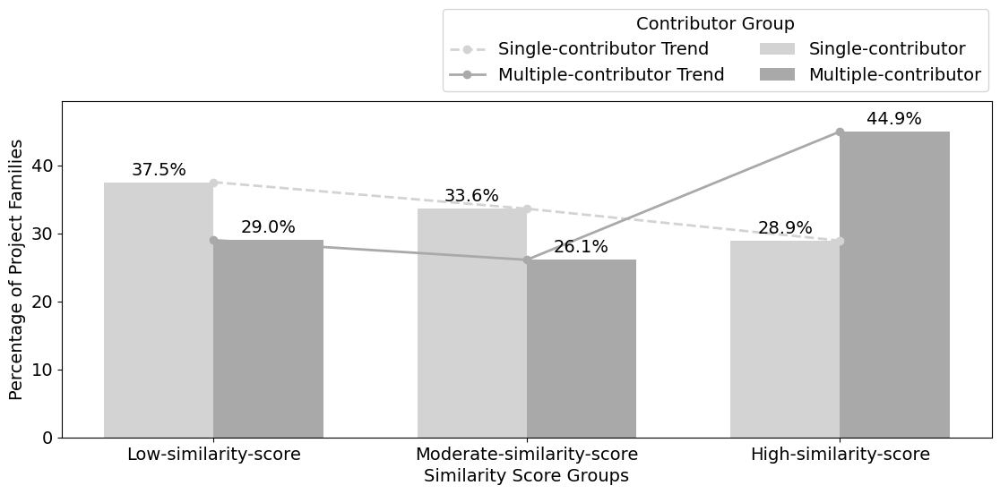

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Group and count
grouped = df.groupby(['similarity_score_group', 'common_author_group']).size().unstack(fill_value=0)

# Order for x-axis
similarity_order = ["Low-similarity-score", "Moderate-similarity-score", "High-similarity-score"]
grouped = grouped.reindex(similarity_order)

# Calculate total count for each author group across all similarity levels
total_single_contributor = grouped['Single-author'].sum()
total_multiple_authors = grouped['Multiple-authors'].sum()

# Calculate percentages across all similarity levels
percentages = grouped.copy()
percentages['Single-author'] = (grouped['Single-author'] / total_single_contributor) * 100
percentages['Multiple-authors'] = (grouped['Multiple-authors'] / total_multiple_authors) * 100

# Plot setup
plt.rcParams.update({'font.size': 14})
fig, ax = plt.subplots(figsize=(12, 6))

x = np.arange(len(similarity_order))  # positions for the similarity score groups
width = 0.35  # bar width

# Plot bars: one set per contributor group
rects1 = ax.bar(x - width/2, percentages['Single-author'], width, label='Single-contributor', color='lightgray')
rects2 = ax.bar(x + width/2, percentages['Multiple-authors'], width, label='Multiple-contributor', color='darkgray')

# Plot trend lines
ax.plot(x, percentages['Single-author'], label='Single-contributor Trend', color='lightgray', marker='o', linestyle='--', linewidth=2)
ax.plot(x, percentages['Multiple-authors'], label='Multiple-contributor Trend', color='darkgray', marker='o', linestyle='-', linewidth=2)

# Axes and labels
ax.set_xlabel('Similarity Score Groups', fontsize=14)
ax.set_ylabel('Percentage of Project Families', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(similarity_order, fontsize=14)

# Adjust y-axis limit to avoid cutting off the labels
max_percentage = max(percentages['Single-author'].max(), percentages['Multiple-authors'].max())
ax.set_ylim(0, max_percentage * 1.1)  # Set a limit higher than the max percentage

# Adjust legend to be outside the plot area, positioned at the top
ax.legend(title='Contributor Group', fontsize=14, bbox_to_anchor=(0.4, 1.3), loc='upper left', ncol=2)

# Add data labels on bars
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.1f}%',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom',
                    fontsize=14)

autolabel(rects1)
autolabel(rects2)

plt.tight_layout()
plt.savefig("argument2_2.pdf", bbox_inches='tight')
plt.show()


In [3]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
import re


# Load the CSV files
file1 = "GH_labelled_combined_csv_file.csv"
file2 = "HF_all_labels_from_gemini.csv"
f2 = "must_exclude_from_all_analysis.csv"
f3 = "families_per_bin_used.csv"

GH1 = pd.read_csv(file1, encoding='latin1')
HF1 = pd.read_csv(file2, encoding='latin1')
dfs2 = pd.read_csv(f2, encoding='latin1')
family_bin = pd.read_csv(f3, encoding='latin1')

exclusion = list(dfs2['family'].unique())
excluded_labels = ['bug fix', 'unclear', 'uncategorized', 'add model']

GH2 = GH1[~GH1['family'].isin(exclusion)]
HF2 = HF1[~HF1['family'].isin(exclusion)]

GH_commit = GH2[~GH2['label'].isin(excluded_labels)]
HF_commit = HF2[~HF2['label'].isin(excluded_labels)]

C:\Users\LabSystem\AppData\Local\Temp\ipykernel_19376\104991217.py:16: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  GH1 = pd.read_csv(file1, encoding='latin1')


In [4]:
GH = GH_commit.groupby(['label', 'commit_message'])['owner'].nunique().reset_index()
HF = HF_commit.groupby(['label', 'combined'])['owner'].nunique().reset_index()

In [5]:
GH['label'].value_counts()

label
model structure              32396
external documentation       15830
training infrastructure       9977
validation infrastructure     8495
preprocessing                 5899
sharing                       4114
internal documentation        3907
pipeline performance          3693
parameter tuning              3430
input data                    2824
update dependency             2822
add dependency                2666
project metadata              2577
remove dependency              783
output data                    411
Name: count, dtype: int64

In [6]:
GH_model_structure = GH[GH['label'] == "model structure"]
GH_external = GH[GH['label'] == "external documentation"]
GH_training = GH[GH['label'] == "training infrastructure"]
GH_validation = GH[GH['label'] == "validation infrastructure"]
GH_preprocessing = GH[GH['label'] == "preprocessing"]
GH_sharing = GH[GH['label'] == "sharing"]
GH_internal = GH[GH['label'] == "internal documentation"]
GH_pipeline = GH[GH['label'] == "pipeline performance"]
GH_parameter = GH[GH['label'] == "parameter tuning"]
GH_input = GH[GH['label'] == "input data"]
GH_update = GH[GH['label'] == "update dependency"]
GH_add = GH[GH['label'] == "add dependency"]
GH_project = GH[GH['label'] == "project metadata"]
GH_remove = GH[GH['label'] == "remove dependency"]
GH_output = GH[GH['label'] == "output data"]



HF_model_structure = HF[HF['label'] == "model structure"]
HF_external = HF[HF['label'] == "external documentation"]
HF_training = HF[HF['label'] == "training infrastructure"]
HF_validation = HF[HF['label'] == "validation infrastructure"]
HF_preprocessing = HF[HF['label'] == "preprocessing"]
HF_sharing = HF[HF['label'] == "sharing"]
HF_internal = HF[HF['label'] == "internal documentation"]
HF_pipeline = HF[HF['label'] == "pipeline performance"]
HF_parameter = HF[HF['label'] == "parameter tuning"]
HF_input = HF[HF['label'] == "input data"]
HF_update = HF[HF['label'] == "update dependency"]
HF_add = HF[HF['label'] == "add dependency"]
HF_project = HF[HF['label'] == "project metadata"]
HF_remove = HF[HF['label'] == "remove dependency"]
HF_output = HF[HF['label'] == "output data"]

In [7]:
GH_model_structure 

,label,commit_message,owner
25227,model structure,!540 add dotattention merge pull request !540 ...,1
25228,model structure,!548 add basemodel merge pull request !548 fro...,1
25229,model structure,!550 add backbones merge pull request !550 fro...,1
25230,model structure,!556 add attentions api merge pull request !55...,1
25231,model structure,!557 add rnn merge pull request !557 from wang...,1
...,...,...,...
57618,model structure,Ã£Â°Ã¢ÂÃ¢ÂÃ¢Â¨Ã£Â°Ã¢ÂÃ¢ÂÃ¢Â¨Ã£Â°Ã¢ÂÃ¢ÂÃ¢...,1
57619,model structure,Ã£Â°Ã¢ÂÃ¢ÂÃ¢Â¨Ã£Â°Ã¢ÂÃ¢ÂÃ¢Â¨Ã£Â°Ã¢ÂÃ¢ÂÃ¢...,1
57620,model structure,Ã£Â°Ã¢ÂÃ¢Â¤Ã¢Â¡,1
57621,model structure,Ã£Â°Ã¢ÂÃ¢Â¥Ã¢Â Ã£Â°Ã¢ÂÃ¢ÂÃ¢Â,1


In [8]:
HF_model_structure

,label,combined,owner
1145,model structure,341b tokens model (#7) - model ckpt at 341b to...,1
1146,model structure,341b tokens model (#8) - update to 341b tokens...,1
1147,model structure,adapt model weights,1
1148,model structure,add .bin version,1
1149,model structure,add 1st preview model -- trained >9b tokens,1
...,...,...,...
2021,model structure,weights,1
2022,model structure,weights update,1
2023,model structure,welch model added,1
2024,model structure,widget inference params + examples (#15) - wid...,1


In [9]:
import re
from bertopic import BERTopic

# Extract commit messages as a list
docs = GH_model_structure['commit_message'].astype(str).tolist()

# Function to preprocess commit messages
def preprocess_text(text):
    text = text.lower()  # Convert to lowercase

    # Remove specific words and file extensions
    text = re.sub(r'\b(by|co|of|authored|.md)\b', '', text, flags=re.IGNORECASE)
    
    # Remove numbers and special characters (except hyphens and spaces)
    text = re.sub(r'[^\w\s-]', '', text)
    
    # Remove extra spaces
    text = re.sub(r'\s+', ' ', text).strip()
    
    return text

# Apply preprocessing to all commit messages
cleaned_docs = [preprocess_text(message) for message in docs]

# Initialize and train BERTopic
topic_model = BERTopic(language="english", calculate_probabilities=True, verbose=True)
topics, probs = topic_model.fit_transform(cleaned_docs)

2025-03-26 20:03:22,484 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1013 [00:00<?, ?it/s]

2025-03-26 20:07:57,807 - BERTopic - Embedding - Completed ✓
2025-03-26 20:07:57,808 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-03-26 20:08:37,279 - BERTopic - Dimensionality - Completed ✓
2025-03-26 20:08:37,280 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-03-26 20:22:27,847 - BERTopic - Cluster - Completed ✓
2025-03-26 20:22:27,859 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-03-26 20:22:29,304 - BERTopic - Representation - Completed ✓


In [10]:
freq = topic_model.get_topic_info(); 
freq.head(5)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,8845,-1_feat_skill_codestyle_fix,"[feat, skill, codestyle, fix, in, to, upd, and...",[featquestions in dummy skill 183 fix lower sc...
1,0,486,0_tests_suggestions_sylvain_gugger,"[tests, suggestions, sylvain, gugger, apply, n...",[add mllama 33703 current changes nit add cros...
2,1,382,1_piperoriginrevid_internal_refactors_adds,"[piperoriginrevid, internal, refactors, adds, ...",[replace use deprecated affinescalar bijector ...
3,2,325,2_bert_bert2bert_bertmodel_albert,"[bert, bert2bert, bertmodel, albert, deebert, ...","[update bert code, add bert model, 3 in 1 bert]"
4,3,280,3_embedding_embeddings_resize_inputsembeds,"[embedding, embeddings, resize, inputsembeds, ...","[fix input embeddings, embedding, embeddings]"


In [14]:
topic_model.get_topic(1)

[('piperoriginrevid', 0.05374909145795109),
 ('internal', 0.008868485834200964),
 ('refactors', 0.006208974503023734),
 ('adds', 0.00598882275384244),
 ('scann', 0.005977438309574379),
 ('trillsson', 0.005977438309574379),
 ('bijector', 0.005977438309574379),
 ('public', 0.005510154300440573),
 ('heterogeneous', 0.005450064311017051),
 ('visualization', 0.005450064311017051)]

In [12]:
topic_model.visualize_topics()

In [15]:
topic_model.visualize_barchart(top_n_topics=5)

In [36]:
# GitHub Model_structure

import re
import nltk
from nltk.corpus import stopwords
from bertopic import BERTopic
from collections import Counter
import pandas as pd

# Download the NLTK stopwords if not already downloaded
nltk.download('stopwords')

# Extract commit messages as a list
docs = GH_model_structure['commit_message'].astype(str).tolist()

# Load NLTK stopwords
stop_words = set(stopwords.words('english'))

# Function to preprocess commit messages
def preprocess_text(text):
    text = text.lower()  # Convert to lowercase

    # Remove specific words and file extensions
    text = re.sub(r'\b(by|co|of|authored|.md)\b', '', text, flags=re.IGNORECASE)
    
    # Remove numbers and special characters (except hyphens and spaces)
    text = re.sub(r'[^\w\s-]', '', text)
    
    # Remove stopwords using NLTK's stopwords list
    text = ' '.join([word for word in text.split() if word not in stop_words])
    
    # Remove words that are shorter than 3 characters (e.g., "by", "of", "co")
    text = re.sub(r'\b\w{1,2}\b', '', text)
    
    # Remove extra spaces
    text = re.sub(r'\s+', ' ', text).strip()
    
    return text

# Apply preprocessing to all commit messages
cleaned_docs = [preprocess_text(message) for message in docs]

# Initialize and train BERTopic
topic_model = BERTopic(language="english", calculate_probabilities=True, verbose=True)
topics, probs = topic_model.fit_transform(cleaned_docs)

# Extract the words from each topic
topic_word_distributions = topic_model.get_topics()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\LabSystem\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
2025-03-27 11:32:26,894 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1013 [00:00<?, ?it/s]

2025-03-27 11:36:36,487 - BERTopic - Embedding - Completed ✓
2025-03-27 11:36:36,488 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-03-27 11:36:56,508 - BERTopic - Dimensionality - Completed ✓
2025-03-27 11:36:56,509 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-03-27 11:50:49,932 - BERTopic - Cluster - Completed ✓
2025-03-27 11:50:49,943 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-03-27 11:50:51,200 - BERTopic - Representation - Completed ✓


In [ ]:
# Optional: Visualize the word counts (Top N words)
import matplotlib.pyplot as plt

top_n = 20  # You can adjust this number
word_counts_df.head(top_n).plot(kind="barh", x="Word", y="Count", legend=False)
plt.title(f"Top {top_n} Most Frequent Words")
plt.xlabel("Word Frequency")
plt.ylabel("Words")
plt.show()

In [39]:
topic_word_distributions

{-1: [('pull', 0.002143506271083143),
  ('codestyle', 0.0021335920725165086),
  ('feat', 0.002119303617144037),
  ('request', 0.0021049564359062875),
  ('piperoriginrevid', 0.0020584458764969027),
  ('merge', 0.002049496216429313),
  ('pipeline', 0.0020182937816050324),
  ('refactor', 0.002006186094512362),
  ('add', 0.0019128321541128114),
  ('tests', 0.0019080685842455865)],
 0: [('token', 0.02941656596657061),
  ('tokens', 0.026782150484645183),
  ('tokenizer', 0.023265886227229884),
  ('special', 0.014848612169698577),
  ('tokenizers', 0.013025703764915686),
  ('tokenization', 0.01069319826480934),
  ('maxnewtokens', 0.010678530727977562),
  ('testtokenizationledpy', 0.008340265919411382),
  ('useauthtoken', 0.008302251968665957),
  ('eos', 0.007937793667069152)],
 1: [('sylvain', 0.004068516350396769),
  ('gugger', 0.0040529061797970655),
  ('suggestions', 0.004008986398199692),
  ('doc', 0.003904931255562501),
  ('fixup', 0.0038703143601531323),
  ('nielsrogge', 0.003843850451280

                   Word     Score
265         bigrefactor  0.762425
263         greedyuntil  0.746764
327           directory  0.643763
346             alexnet  0.642609
379  multiplechoicetask  0.635254
288            makefile  0.625062
278            finetune  0.616160
444  multiheadattention  0.603272
180      remotetracking  0.577146
299         indentation  0.575349


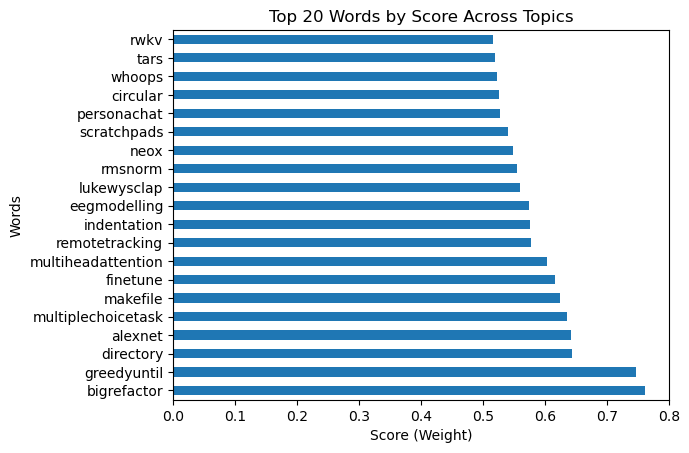

In [51]:
import re
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

# Manually define irrelevant or generic words
irrelevant_words = {"ifelif", "fuck", "lordtt", "misc", "elg", "genetic", "savename", "protection", "syntax", "upddffrelease"}

# Helper function to clean unwanted words
def clean_word(word):
    # Remove non-alphabetic terms and terms shorter than 3 characters
    word = re.sub(r'[^a-zA-Z]', '', word)
    
    if len(word) <= 3 or word in ENGLISH_STOP_WORDS or word in irrelevant_words:
        return None
    
    return word.lower()

# Get the topic-word distributions
topic_word_distributions = topic_model.get_topics()

# Create a list to hold top words for each topic (sorted by weight)
top_words = []

# Extract the highest-scoring word for each topic
for topic_id, words in topic_word_distributions.items():
    # Sort words in each topic by their weight, in descending order
    sorted_words = sorted(words, key=lambda x: x[1], reverse=True)
    
    # Take the top word from each topic (highest score)
    top_word = sorted_words[0]  # Highest weight word
    cleaned_word = clean_word(top_word[0])
    
    if cleaned_word:  # Only add cleaned word
        top_words.append((cleaned_word, top_word[1]))

# Convert the top words to a DataFrame for easier viewing
top_words_df = pd.DataFrame(top_words, columns=["Word", "Score"])

# Sort by score in descending order
top_words_df = top_words_df.sort_values(by="Score", ascending=False)

# Print the top words
top_10 = top_words_df.head(10)
print(top_10)
top_10.to_csv("GH_model_structure_top_terms.csv", index=False)

# Optional: Visualize the top words
import matplotlib.pyplot as plt

top_words_df.head(20).plot(kind="barh", x="Word", y="Score", legend=False)
plt.title("Top 20 Words by Score Across Topics")
plt.xlabel("Score (Weight)")
plt.ylabel("Words")
plt.show()


In [19]:
import re
import pandas as pd
import matplotlib.pyplot as plt
from bertopic import BERTopic
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

# Extract commit messages as a list
docs = GH_model_structure['commit_message'].astype(str).tolist()

# Function to preprocess commit messages
def preprocess_text(text):
    text = text.lower()  # Convert to lowercase
    text = re.sub(r'\b(by|co|of|authored|.md|\d+)\b', '', text)  # Remove .md file extensions
    text = re.sub(r'[^\w\s-]', '', text)  # Remove special characters
    # Remove stopwords (common terms that are not meaningful in topic modeling)
    text = ' '.join([word for word in text.split() if word not in ENGLISH_STOP_WORDS])
    return text.strip()


# Apply preprocessing
cleaned_docs = [preprocess_text(message) for message in docs]

# Initialize BERTopic with settings for better interpretation
topic_model = BERTopic(language="english", 
                       calculate_probabilities=True, 
                       min_topic_size=10,  
                       n_gram_range=(1, 2),  # Capture both unigrams and bigrams
                       verbose=True)

# Fit the model
topics, probs = topic_model.fit_transform(cleaned_docs)

# Reduce number of topics for better analysis (if needed)
topic_model.reduce_topics(cleaned_docs, nr_topics=10)

# Get representative documents for each topic
representative_docs = topic_model.get_representative_docs()

2025-03-27 10:06:42,203 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1013 [00:00<?, ?it/s]

2025-03-27 10:10:57,403 - BERTopic - Embedding - Completed ✓
2025-03-27 10:10:57,403 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-03-27 10:11:15,866 - BERTopic - Dimensionality - Completed ✓
2025-03-27 10:11:15,867 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-03-27 10:25:40,707 - BERTopic - Cluster - Completed ✓
2025-03-27 10:25:40,720 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-03-27 10:25:43,888 - BERTopic - Representation - Completed ✓
2025-03-27 10:25:46,662 - BERTopic - Topic reduction - Reducing number of topics
2025-03-27 10:25:49,340 - BERTopic - Topic reduction - Reduced number of topics from 522 to 10


In [20]:
# Print top words per topic (for better interpretability)
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,8927,-1_fix_add_coauthoredby_update,"[fix, add, coauthoredby, update, tests, test, ...",[bigbird 10183 init bigbird model__init__ work...
1,0,22211,0_fix_add_update_coauthoredby,"[fix, add, update, coauthoredby, remove, model...","[update mgsm_cot_native_teyaml, fix, fix get_s..."
2,1,455,1_operator_add_fix_fx,"[operator, add, fix, fx, index, elementbinary,...",[op added support identity operator 143 op add...
3,2,261,2_roberta_xlmroberta_coauthoredby nateriver_na...,"[roberta, xlmroberta, coauthoredby nateriver, ...",[merge pull request 1512 louismartinfix-robert...
4,3,259,3_comments_changes_elg_review,"[comments, changes, elg, review, comment, addr...","[working pr review comments, addressed review ..."
5,4,101,4_task_tasks_auxtasks_piperoriginrevid,"[task, tasks, auxtasks, piperoriginrevid, pers...","[update new task arg task dict getter, added e..."
6,5,77,5_peft_peft model_adapter_model,"[peft, peft model, adapter, model, fix peft, a...",[fix peft pass device correctly peft 30397 pas...
7,6,42,6_protection_attack_protection protection_db,"[protection, attack, protection protection, db...","[protection, protection, protection]"
8,7,36,7_mapper_hash_hashing_ffmapper,"[mapper, hash, hashing, ffmapper, tasks mapper...","[mapper implement new mapper flexflow, mapper ..."
9,8,27,8_dataloader_progressbar_progressbar training_...,"[dataloader, progressbar, progressbar training...",[new dataloader cr 90 python new dataloader py...


In [34]:
topic_model.visualize_barchart(top_n_topics=10)

In [27]:
from sklearn.cluster import KMeans
import numpy as np

# Get the topic-word distributions
topic_word_distributions = topic_model.get_topics()

# Convert to a list of topic-word vectors (ignoring stopwords)
topic_vectors = []
for topic_id, words in topic_word_distributions.items():
    word_weights = [weight for _, weight in words]
    topic_vectors.append(word_weights)

# Make sure all vectors are the same length (pad shorter vectors with zeros if necessary)
max_length = max(len(vector) for vector in topic_vectors)
topic_vectors_padded = [vector + [0] * (max_length - len(vector)) for vector in topic_vectors]

# Convert to numpy array
X = np.array(topic_vectors_padded)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=42)  # You can adjust `n_clusters` based on your data
topic_labels = kmeans.fit_predict(X)

# Print the cluster assignments for each topic
for topic_id, cluster in zip(topic_model.get_topic_info()['Topic'], topic_labels):
    print(f"Topic {topic_id} is assigned to cluster {cluster}")

Topic -1 is assigned to cluster 2
Topic 0 is assigned to cluster 2
Topic 1 is assigned to cluster 2
Topic 2 is assigned to cluster 0
Topic 3 is assigned to cluster 0
Topic 4 is assigned to cluster 0
Topic 5 is assigned to cluster 1
Topic 6 is assigned to cluster 3
Topic 7 is assigned to cluster 1
Topic 8 is assigned to cluster 4


In [35]:
import re
import pandas as pd
import numpy as np
from bertopic import BERTopic
from sklearn.feature_extraction.text import TfidfVectorizer

# Step 1: Extract commit messages as a list
docs = GH_model_structure['commit_message'].astype(str).tolist()

# Step 2: Preprocess commit messages
def preprocess_text(text):
    text = text.lower()  # Convert to lowercase
    text = re.sub(r'\b(by|co|of|authored|.md|\d+)\b', '', text)  # Remove .md file extensions
    text = re.sub(r'[^\w\s-]', '', text)  # Remove special characters
    return text.strip()

# Apply preprocessing
cleaned_docs = [preprocess_text(message) for message in docs]

# Step 3: Initialize and fit the BERTopic model
topic_model = BERTopic(language="english", 
                       calculate_probabilities=True, 
                       min_topic_size=10,  
                       n_gram_range=(1, 2),  
                       verbose=True)

# Fit the model
topics, probs = topic_model.fit_transform(cleaned_docs)

# Step 4: Use TF-IDF to extract more meaningful terms
# Create a TF-IDF Vectorizer
vectorizer = TfidfVectorizer(stop_words="english", ngram_range=(1, 2), max_df=0.95, min_df=2)

# Fit and transform the cleaned documents
X_tfidf = vectorizer.fit_transform(cleaned_docs)

# Step 5: Get the top 5 terms from each topic after fitting the BERTopic model
topic_word_distributions = topic_model.get_topics()

# Iterate over topics and extract the top 5 TF-IDF weighted terms
top_terms_per_topic = {}
for topic_id, words in topic_word_distributions.items():
    # Get the top terms and their weights
    top_terms = [word for word, _ in words[:10]]  # Get top 10 words for each topic
    
    # Filter the terms using TF-IDF weights
    term_weights = {}
    for term in top_terms:
        idx = vectorizer.vocabulary_.get(term, None)
        if idx is not None:
            term_weights[term] = X_tfidf.getcol(idx).mean()  # Average the TF-IDF score for the term
    
    # Sort by the highest TF-IDF scores
    sorted_terms = sorted(term_weights.items(), key=lambda x: x[1], reverse=True)
    
    # Get the top 5 TF-IDF weighted terms
    top_terms_per_topic[topic_id] = sorted_terms[:5]

# Step 6: Display the top 5 meaningful terms for each topic
for topic_id, top_terms in top_terms_per_topic.items():
    print(f"Topic {topic_id}: {', '.join([term[0] for term in top_terms])}")


2025-03-27 11:01:55,002 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1013 [00:00<?, ?it/s]

2025-03-27 11:06:16,343 - BERTopic - Embedding - Completed ✓
2025-03-27 11:06:16,344 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-03-27 11:06:33,988 - BERTopic - Dimensionality - Completed ✓
2025-03-27 11:06:33,991 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-03-27 11:22:23,749 - BERTopic - Cluster - Completed ✓
2025-03-27 11:22:23,765 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-03-27 11:22:26,900 - BERTopic - Representation - Completed ✓


Topic -1: fix, add, test, tests, feat
Topic 0: 
Topic 1: tokenizer, token, tokens, special, tokenization
Topic 2: chat, template, conversation, service, chat template
Topic 3: bert, fix bert, bert model, bert models, tf bert
Topic 4: embeddings, embedding, word, resize, fix embedding
Topic 5: tensor, tensorflow, tensors, oob, tensorflow backend
Topic 6: conversion, review, sylvain, sylvain gugger, gugger
Topic 7: torch, torchscript, torchagent, fix torch, mps
Topic 8: onnx, export, add onnx, onnx export, onnx model
Topic 9: llama, van bortel, bortel, llamacpp, llama2
Topic 10: dict, state, dictionary, state dict, dicts
Topic 11: gpt, gpt2, gptj, gpt3, fix gpt
Topic 12: pytorch, backend, fx, fix pytorch, pytorch fix
Topic 13: prompt, prompts, fix prompt, promptnode, prompt template
Topic 14: tf, t5, pt, fix tf, mt5
Topic 15: xin, yiliu30, chensuyue
Topic 16: keras, keras add, functional, keras clean, surface
Topic 17: flax, finish, patrick, von, platen
Topic 18: refactor, refactoring, r

In [31]:
topic_model.get_topic(1)

[('operator', 0.03613456871817717),
 ('add', 0.0303606325124165),
 ('fix', 0.027029855907185107),
 ('fx', 0.026289926633686813),
 ('index', 0.026142400282448203),
 ('elementbinary', 0.0256451174489221),
 ('function', 0.02500625309627945),
 ('reranker', 0.02310569236053614),
 ('support', 0.021982581523219965),
 ('lattice', 0.019469515455372285)]

In [ ]:
import re
import numpy as np
import pandas as pd
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.vectorizers import ClassTfidfTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora import Dictionary

# Load commit messages
docs = GH_model_structure['commit_message'].astype(str).tolist()

# Preprocessing Function
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'\b(by|co|of|authored|.md)\b', '', text, flags=re.IGNORECASE)
    text = re.sub(r'[^\w\s-]', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    return text

# Apply preprocessing
cleaned_docs = [preprocess_text(message) for message in docs]
print(f"Total valid documents: {len(cleaned_docs)}")  # Debugging

# Ensure no empty docs
cleaned_docs = [doc for doc in cleaned_docs if doc.strip()]
if not cleaned_docs:
    raise ValueError("No valid documents after preprocessing!")

# Load embedding model
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

# Reduce dimensionality
umap_model = UMAP(n_neighbors=10, n_components=3, metric="cosine", random_state=42)

# Custom vectorizer
vectorizer_model = CountVectorizer(ngram_range=(1, 2), stop_words="english")

# Improve topic separation
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

# Better clustering
hdbscan_model = HDBSCAN(
    min_cluster_size=3,
    min_samples=1,
    metric='euclidean',
    prediction_data=True  # Must be True for probabilities
)

# Initialize BERTopic
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    ctfidf_model=ctfidf_model,
    calculate_probabilities=True,
    verbose=True
)

# Fit BERTopic
try:
    topics, probs = topic_model.fit_transform(cleaned_docs)
    print("Topics generated:", len(set(topics)))
except Exception as e:
    print("Error:", e)
    # Fallback: Fit without probabilities
    topic_model.calculate_probabilities = False
    topics = topic_model.fit_transform(cleaned_docs)

# Compute Coherence Score
topic_words = [[word for word, _ in topic_model.get_topic(topic)] for topic in set(topics) if topic != -1]
dictionary = Dictionary([doc.split() for doc in cleaned_docs])
corpus = [dictionary.doc2bow(doc.split()) for doc in cleaned_docs]

coherence_model = CoherenceModel(
    topics=topic_words, 
    texts=[doc.split() for doc in cleaned_docs], 
    dictionary=dictionary, 
    coherence='c_v'
)

coherence_score = coherence_model.get_coherence()
print(f"Topic Coherence Score: {coherence_score}")

# Save topics
topic_df = topic_model.get_topic_info()
topic_df.to_csv("topic_results.csv", index=False)

# Visualize topics
topic_model.visualize_barchart(top_n_topics=10)

Total valid documents: 32396


2025-03-26 18:15:53,905 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1013 [00:00<?, ?it/s]

2025-03-26 18:19:29,330 - BERTopic - Embedding - Completed ✓
2025-03-26 18:19:29,331 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-03-26 18:19:52,375 - BERTopic - Dimensionality - Completed ✓
2025-03-26 18:19:52,377 - BERTopic - Cluster - Start clustering the reduced embeddings


In [ ]:
import re
import numpy as np
import pandas as pd
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.vectorizers import ClassTfidfTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora import Dictionary

# Load commit messages
docs = GH_model_structure['commit_message'].astype(str).tolist()

# Preprocessing
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'\b(by|co|of|authored|.md)\b', '', text, flags=re.IGNORECASE)
    text = re.sub(r'[^\w\s-]', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    return text

cleaned_docs = [preprocess_text(message) for message in docs]
cleaned_docs = [doc for doc in cleaned_docs if doc.strip()]

# ✅ Use precomputed embeddings
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = embedding_model.encode(cleaned_docs, show_progress_bar=True)

# ✅ Speed up UMAP & HDBSCAN
umap_model = UMAP(n_neighbors=5, n_components=2, metric="cosine", min_dist=0.1)
hdbscan_model = HDBSCAN(min_cluster_size=3, min_samples=1, metric="euclidean", cluster_selection_method="leaf")

# ✅ Limit vocabulary size
vectorizer_model = CountVectorizer(ngram_range=(1, 2), stop_words="english", max_features=5000)

# ✅ Faster topic separation
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

# ✅ Initialize BERTopic
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    ctfidf_model=ctfidf_model,
    calculate_probabilities=False,  # Speeds up processing
    verbose=True
)

# ✅ Process a sample first (Max 5000 docs)
sample_size = min(5000, len(cleaned_docs))
sample_docs = cleaned_docs[:sample_size]
topics, probs = topic_model.fit_transform(sample_docs, embeddings[:sample_size])

# ✅ Coherence Score
topic_words = [[word for word, _ in topic_model.get_topic(topic)] for topic in set(topics) if topic != -1]
dictionary = Dictionary([doc.split() for doc in sample_docs])
corpus = [dictionary.doc2bow(doc.split()) for doc in sample_docs]

coherence_model = CoherenceModel(topics=topic_words, texts=[doc.split() for doc in sample_docs], dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()
print(f"Topic Coherence Score: {coherence_score}")

# ✅ Save topics
topic_df = topic_model.get_topic_info()
topic_df.to_csv("topic_results.csv", index=False)

# ✅ Visualize topics
topic_model.visualize_barchart(top_n_topics=10)


In [2]:
pip install bertopic

Note: you may need to restart the kernel to use updated packages.


DEPRECATION: Loading egg at c:\users\labsystem\appdata\local\anaconda3\envs\mlearning\lib\site-packages\huggingface_hub-0.18.0-py3.8.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330
